## Supplemental Bus-to-Park Access notebook

Author: Katrina Deloso

Since the main notebook is large and contains a cell that takes so long to run, I extracted the last section from that notebook and used it to make edits to the final maps.

In [3]:
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from shapely.geometry import Point, LineString, Polygon
from descartes import PolygonPatch

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [4]:
busstops = gpd.read_file('buses30stopsSSL.geojson')
busstops

,STOPNUM,STOPNAME,LAT,LONG,geometry
0,1,PARAMOUNT / SLAUSON,33.973248,-118.113113,POINT (-118.11311 33.97325)
1,17,1ST \ BELVEDERE CO PARK,34.036928,-118.158947,POINT (-118.15895 34.03693)
2,18,1ST / EASTERN,34.036881,-118.173232,POINT (-118.17323 34.03688)
3,21,1ST / MEDNIK,34.036963,-118.161604,POINT (-118.16160 34.03696)
4,22,1ST / COLLEGIAN,34.036990,-118.148774,POINT (-118.14877 34.03699)
...,...,...,...,...,...
8145,13000064,ARTESIA / VAN NESS,33.872995,-118.318166,POINT (-118.31817 33.87300)
8146,13000065,ARTESIA / CASIMIR,33.872987,-118.321981,POINT (-118.32198 33.87299)
8147,7785,MAIN / RAYMOND,34.091323,-118.144825,POINT (-118.14482 34.09132)
8148,7792,MAIN / MARENGO,34.091387,-118.141766,POINT (-118.14177 34.09139)


However, I should only be considering all the bus stops that fall within 30 min drive sheds and that are on the same route as the buses that stop by parks. So next I import the subset of bus stops on those routes

In [5]:
busesonroutes = gpd.read_file('busesonroutes.geojson')
busesonroutes

,STOPNUM,LINE,DIR_A2,STOPNAME,LAT,LONG,geometry
0,12,163,E,15054 SHERMAN WAY,34.201075,-118.461953,POINT (-13187124.286 4055833.548)
1,16,96,N,RIVERSIDE / LOS FELIZ,34.116932,-118.271486,POINT (-13165921.597 4044513.965)
2,26,176,E,TELSTAR \ COUNTY CHILD SERVICES,34.068749,-118.066576,POINT (-13143111.120 4038037.077)
3,33,236,N,BALBOA \ FOOTHILL WEST JOG,34.322084,-118.495243,POINT (-13190830.112 4072132.467)
4,40,90,N,HILL / 5TH,34.048591,-118.251764,POINT (-13163726.154 4035328.478)
...,...,...,...,...,...,...,...
5058,70500030,176,W,RUSH \ SAN GABRIEL,34.051617,-118.090279,POINT (-13145749.726 4035735.036)
5059,70500034,252,S,HUNTINGTON / MONTEREY,34.086079,-118.187737,POINT (-13156598.701 4040366.197)
5060,70500036,70,E,17TH / HILL,34.034213,-118.265336,POINT (-13165236.982 4033396.922)
5061,70500039,770,E,CESAR E CHAVEZ / ROWAN,34.040383,-118.186842,POINT (-13156499.070 4034225.766)


Next, I want to merge the dataframes by stop number so that I only have the stops that both fall into the 30 minute drive isochrones AND are on the routes that serve parks. That subset will be called 'newbus'

In [6]:
newbus = pd.merge(busesonroutes, busstops, how='inner', on='STOPNUM')
newbus

,STOPNUM,LINE,DIR_A2,STOPNAME_x,LAT_x,LONG_x,geometry_x,STOPNAME_y,LAT_y,LONG_y,geometry_y
0,12,163,E,15054 SHERMAN WAY,34.201075,-118.461953,POINT (-13187124.286 4055833.548),15054 SHERMAN WAY,34.201075,-118.461953,POINT (-118.46195 34.20108)
1,16,96,N,RIVERSIDE / LOS FELIZ,34.116932,-118.271486,POINT (-13165921.597 4044513.965),RIVERSIDE / LOS FELIZ,34.116932,-118.271486,POINT (-118.27149 34.11693)
2,26,176,E,TELSTAR \ COUNTY CHILD SERVICES,34.068749,-118.066576,POINT (-13143111.120 4038037.077),TELSTAR \ COUNTY CHILD SERVICES,34.068749,-118.066576,POINT (-118.06658 34.06875)
3,40,90,N,HILL / 5TH,34.048591,-118.251764,POINT (-13163726.154 4035328.478),HILL / 5TH,34.048591,-118.251764,POINT (-118.25176 34.04859)
4,47,234,N,7TH / MACLAY,34.293980,-118.427206,POINT (-13183256.268 4068344.997),7TH / MACLAY,34.293980,-118.427206,POINT (-118.42721 34.29398)
...,...,...,...,...,...,...,...,...,...,...,...
3748,70500030,176,W,RUSH \ SAN GABRIEL,34.051617,-118.090279,POINT (-13145749.726 4035735.036),RUSH \ SAN GABRIEL,34.051617,-118.090279,POINT (-118.09028 34.05162)
3749,70500034,252,S,HUNTINGTON / MONTEREY,34.086079,-118.187737,POINT (-13156598.701 4040366.197),HUNTINGTON / MONTEREY,34.086079,-118.187737,POINT (-118.18774 34.08608)
3750,70500036,70,E,17TH / HILL,34.034213,-118.265336,POINT (-13165236.982 4033396.922),17TH / HILL,34.034213,-118.265336,POINT (-118.26534 34.03421)
3751,70500039,770,E,CESAR E CHAVEZ / ROWAN,34.040383,-118.186842,POINT (-13156499.070 4034225.766),CESAR E CHAVEZ / ROWAN,34.040383,-118.186842,POINT (-118.18684 34.04038)


In [7]:
newbus.drop_duplicates(subset=['STOPNUM'])
newbus

,STOPNUM,LINE,DIR_A2,STOPNAME_x,LAT_x,LONG_x,geometry_x,STOPNAME_y,LAT_y,LONG_y,geometry_y
0,12,163,E,15054 SHERMAN WAY,34.201075,-118.461953,POINT (-13187124.286 4055833.548),15054 SHERMAN WAY,34.201075,-118.461953,POINT (-118.46195 34.20108)
1,16,96,N,RIVERSIDE / LOS FELIZ,34.116932,-118.271486,POINT (-13165921.597 4044513.965),RIVERSIDE / LOS FELIZ,34.116932,-118.271486,POINT (-118.27149 34.11693)
2,26,176,E,TELSTAR \ COUNTY CHILD SERVICES,34.068749,-118.066576,POINT (-13143111.120 4038037.077),TELSTAR \ COUNTY CHILD SERVICES,34.068749,-118.066576,POINT (-118.06658 34.06875)
3,40,90,N,HILL / 5TH,34.048591,-118.251764,POINT (-13163726.154 4035328.478),HILL / 5TH,34.048591,-118.251764,POINT (-118.25176 34.04859)
4,47,234,N,7TH / MACLAY,34.293980,-118.427206,POINT (-13183256.268 4068344.997),7TH / MACLAY,34.293980,-118.427206,POINT (-118.42721 34.29398)
...,...,...,...,...,...,...,...,...,...,...,...
3748,70500030,176,W,RUSH \ SAN GABRIEL,34.051617,-118.090279,POINT (-13145749.726 4035735.036),RUSH \ SAN GABRIEL,34.051617,-118.090279,POINT (-118.09028 34.05162)
3749,70500034,252,S,HUNTINGTON / MONTEREY,34.086079,-118.187737,POINT (-13156598.701 4040366.197),HUNTINGTON / MONTEREY,34.086079,-118.187737,POINT (-118.18774 34.08608)
3750,70500036,70,E,17TH / HILL,34.034213,-118.265336,POINT (-13165236.982 4033396.922),17TH / HILL,34.034213,-118.265336,POINT (-118.26534 34.03421)
3751,70500039,770,E,CESAR E CHAVEZ / ROWAN,34.040383,-118.186842,POINT (-13156499.070 4034225.766),CESAR E CHAVEZ / ROWAN,34.040383,-118.186842,POINT (-118.18684 34.04038)


In [8]:
busstops = newbus[[
    'STOPNUM','LINE','STOPNAME_x','geometry_x'
]]
busstops

,STOPNUM,LINE,STOPNAME_x,geometry_x
0,12,163,15054 SHERMAN WAY,POINT (-13187124.286 4055833.548)
1,16,96,RIVERSIDE / LOS FELIZ,POINT (-13165921.597 4044513.965)
2,26,176,TELSTAR \ COUNTY CHILD SERVICES,POINT (-13143111.120 4038037.077)
3,40,90,HILL / 5TH,POINT (-13163726.154 4035328.478)
4,47,234,7TH / MACLAY,POINT (-13183256.268 4068344.997)
...,...,...,...,...
3748,70500030,176,RUSH \ SAN GABRIEL,POINT (-13145749.726 4035735.036)
3749,70500034,252,HUNTINGTON / MONTEREY,POINT (-13156598.701 4040366.197)
3750,70500036,70,17TH / HILL,POINT (-13165236.982 4033396.922)
3751,70500039,770,CESAR E CHAVEZ / ROWAN,POINT (-13156499.070 4034225.766)


In [9]:
busstops.columns = [
    'STOPNUM','LINE','STOPNAME','geometry'
]
busstops

,STOPNUM,LINE,STOPNAME,geometry
0,12,163,15054 SHERMAN WAY,POINT (-13187124.286 4055833.548)
1,16,96,RIVERSIDE / LOS FELIZ,POINT (-13165921.597 4044513.965)
2,26,176,TELSTAR \ COUNTY CHILD SERVICES,POINT (-13143111.120 4038037.077)
3,40,90,HILL / 5TH,POINT (-13163726.154 4035328.478)
4,47,234,7TH / MACLAY,POINT (-13183256.268 4068344.997)
...,...,...,...,...
3748,70500030,176,RUSH \ SAN GABRIEL,POINT (-13145749.726 4035735.036)
3749,70500034,252,HUNTINGTON / MONTEREY,POINT (-13156598.701 4040366.197)
3750,70500036,70,17TH / HILL,POINT (-13165236.982 4033396.922)
3751,70500039,770,CESAR E CHAVEZ / ROWAN,POINT (-13156499.070 4034225.766)


In [10]:
busstops = gpd.GeoDataFrame(busstops, geometry='geometry')
busstops = busstops.to_crs(epsg=4326)
busstops.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Next, I import census tract data from Census Reporter

In [11]:
censustracts = gpd.read_file('acs2019_5yr_B01003_14000US06037432102.geojson')
censustracts

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US06037,"Los Angeles County, CA",10081570.0,0.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
...,...,...,...,...,...
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,23.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470..."
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505..."
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


Drop the first row, which gives us data for LA County as a whole

In [12]:
censustracts = censustracts.drop([0])
censustracts

,geoid,name,B01003001,"B01003001, Error",geometry
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,394.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
...,...,...,...,...,...
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,23.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470..."
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505..."
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


Clean up the census tracts and rename columns

In [13]:
censustracts = censustracts[[
    'geoid','name','B01003001', 'geometry'
]]
censustracts

,geoid,name,B01003001,geometry
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
...,...,...,...,...
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470..."
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505..."
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [14]:
censustracts.columns = [
   'FIPS', 'name','Population','geometry']
censustracts

,FIPS,name,Population,geometry
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
...,...,...,...,...
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470..."
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505..."
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [15]:
censustracts = censustracts.to_crs(epsg=4326)

Once again, I run an s-join to match up the bus stops and census tracts. This will generate the census tracts that contain bus stops that lead to parks

In [16]:
from geopandas.tools import sjoin
tractswbuses = sjoin(censustracts, busstops, how='left')
tractswbuses.sample(20)


,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME
1460,14000US06037500404,"Census Tract 5004.04, Los Angeles, CA",4551.0,"MULTIPOLYGON (((-118.08080 34.01057, -118.0806...",513.0,2386.0,266.0,ROSEMEAD \ BEVERLY BL
1851,14000US06037571701,"Census Tract 5717.01, Los Angeles, CA",6247.0,"MULTIPOLYGON (((-118.20766 33.83945, -118.2075...",NaN,NaN,NaN,NaN
234,14000US06037127920,"Census Tract 1279.20, Los Angeles, CA",4716.0,"MULTIPOLYGON (((-118.43999 34.20120, -118.4378...",2899.0,15223.0,165.0,VANOWEN / RANCHITO
40,14000US06037106112,"Census Tract 1061.12, Los Angeles, CA",5611.0,"MULTIPOLYGON (((-118.42782 34.31545, -118.4263...",390.0,2025.0,90.0,FOOTHILL \ HOME DEPOT
920,14000US06037275311,"Census Tract 2753.11, Los Angeles, CA",5462.0,"MULTIPOLYGON (((-118.43110 33.99638, -118.4302...",NaN,NaN,NaN,NaN
56,14000US06037106646,"Census Tract 1066.46, Los Angeles, CA",3161.0,"MULTIPOLYGON (((-118.50214 34.27818, -118.5021...",1668.0,8927.0,236.0,BALBOA / RINALDI
231,14000US06037127805,"Census Tract 1278.05, Los Angeles, CA",3627.0,"MULTIPOLYGON (((-118.46619 34.19392, -118.4640...",1324.0,6862.0,165.0,VANOWEN / NOBLE
350,14000US06037143700,"Census Tract 1437, Los Angeles, CA",3811.0,"MULTIPOLYGON (((-118.37507 34.13148, -118.3750...",135.0,558.0,237.0,CAHUENGA / OAKSHIRE
231,14000US06037127805,"Census Tract 1278.05, Los Angeles, CA",3627.0,"MULTIPOLYGON (((-118.46619 34.19392, -118.4640...",3554.0,23405.0,234.0,SEPULVEDA / VANOWEN
1508,14000US06037503501,"Census Tract 5035.01, Los Angeles, CA",6444.0,"MULTIPOLYGON (((-118.02444 33.92511, -118.0241...",NaN,NaN,NaN,NaN


In [17]:
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",372.0,2003.0,90.0,FOOTHILL / APPERSON
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",NaN,NaN,NaN,NaN
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",410.0,2048.0,90.0,FOOTHILL / PLAINVIEW
...,...,...,...,...,...,...,...,...
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470...",3698.0,23200059.0,232.0,ANAHEIM / HARBOR
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470...",3367.0,17628.0,232.0,ANAHEIM / SANTA FE
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505...",NaN,NaN,NaN,NaN
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325...",NaN,NaN,NaN,NaN


In [18]:
tractswbuses = tractswbuses.dropna()
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",372.0,2003.0,90.0,FOOTHILL / APPERSON
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",410.0,2048.0,90.0,FOOTHILL / PLAINVIEW
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD
...,...,...,...,...,...,...,...,...
2338,14000US06037980025,"Census Tract 9800.25, Los Angeles, CA",0.0,"MULTIPOLYGON (((-118.25712 33.83927, -118.2571...",17.0,202.0,205.0,DEL AMO / TAJAUTA
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905...",1012.0,5120.0,205.0,HARBOR / 6TH
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470...",3697.0,23200058.0,232.0,ANAHEIM / HAYES
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470...",3698.0,23200059.0,232.0,ANAHEIM / HARBOR


Clean the census tracts by removing tracts with populations of less than 100, following cleaning processes from class

In [19]:
tractswbuses = tractswbuses[tractswbuses['Population']>100]
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",372.0,2003.0,90.0,FOOTHILL / APPERSON
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",410.0,2048.0,90.0,FOOTHILL / PLAINVIEW
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD
...,...,...,...,...,...,...,...,...
2337,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",3546.0,20441.0,164.0,VICTORY / WHITE OAK
2337,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2950.0,15459.0,164.0,VICTORY / BALBOA
2337,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2955.0,15465.0,164.0,VICTORY \ BIRMINGHAM HIGH SCHOOL
2337,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2981.0,15496.0,164.0,VICTORY / PETIT


In [20]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

I want to see what the range of bus stops per census tract is (Note: this only includes tracts that have at least one bus stop - it does not contain any tracts with no stops)

In [21]:
stopspertract = tractswbuses.FIPS.value_counts().rename_axis('FIPS').reset_index(name='bus_stop_count')
stopspertract

,FIPS,bus_stop_count
0,14000US06037980024,29
1,14000US06037302401,28
2,14000US06037207400,26
3,14000US06037103200,24
4,14000US06037300600,23
...,...,...
694,14000US06037124203,1
695,14000US06037141202,1
696,14000US06037239201,1
697,14000US06037543501,1


Another way to look at this is by making a bar chart of top 20 tracts

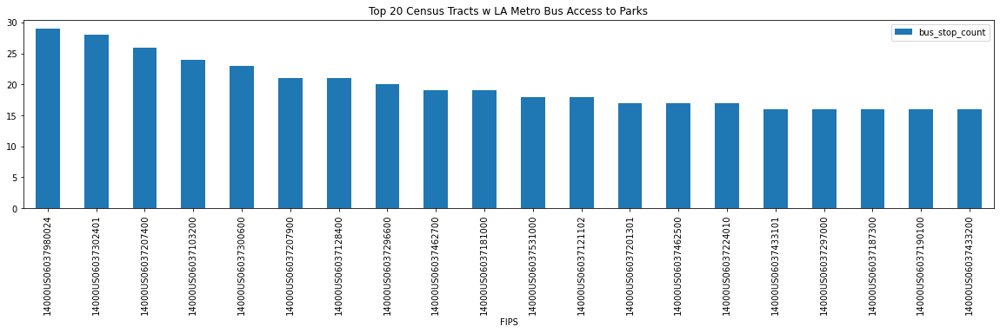

In [22]:
stopspertract[:20].plot.bar(figsize=(20,4),
                             x='FIPS',
                             y='bus_stop_count',
                             title='Top 20 Census Tracts w LA Metro Bus Access to Parks')

I add the count of bus stops per census tract to my original gdf and then drop the duplicate census tract counts

In [23]:
tractswbuses=tractswbuses.merge(stopspertract,on='FIPS')
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME,bus_stop_count
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE,2
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",372.0,2003.0,90.0,FOOTHILL / APPERSON,2
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN,2
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",410.0,2048.0,90.0,FOOTHILL / PLAINVIEW,2
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD,4
...,...,...,...,...,...,...,...,...,...
3701,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",3546.0,20441.0,164.0,VICTORY / WHITE OAK,29
3702,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2950.0,15459.0,164.0,VICTORY / BALBOA,29
3703,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2955.0,15465.0,164.0,VICTORY \ BIRMINGHAM HIGH SCHOOL,29
3704,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",2981.0,15496.0,164.0,VICTORY / PETIT,29


In [24]:
tractswbuses = tractswbuses.drop_duplicates(subset=['FIPS'])
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME,bus_stop_count
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE,2
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN,2
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD,4
8,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",2020.0,10603.0,90.0,FOOTHILL / SALUDA,7
15,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221...",2016.0,10597.0,90.0,FOOTHILL / PINEWOOD,6
...,...,...,...,...,...,...,...,...,...
3659,14000US06037700101,"Census Tract 7001.01, Los Angeles, CA",5200.0,"MULTIPOLYGON (((-118.36154 34.09446, -118.3603...",2710.0,14401.0,4.0,SANTA MONICA / LA BREA,7
3666,14000US06037700102,"Census Tract 7001.02, Los Angeles, CA",4506.0,"MULTIPOLYGON (((-118.36142 34.08722, -118.3613...",1126.0,6015.0,4.0,SANTA MONICA / FULLER,6
3672,14000US06037980015,"Census Tract 9800.15, Los Angeles, CA",671.0,"MULTIPOLYGON (((-118.31048 33.76685, -118.3102...",3351.0,17591.0,205.0,WESTERN / AVENIDA APRENDA,4
3676,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",112.0,515.0,154.0,BURBANK / HAYVENHURST,29


Normalize the data based on population. Since there aren't many bus stops, I calculate this in terms of the number of stops per 100 people in the census tract

In [25]:
tractswbuses['stops_per_100'] = tractswbuses['bus_stop_count']/tractswbuses['Population']*100
tractswbuses

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME,bus_stop_count,stops_per_100
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE,2,0.046696
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN,2,0.031511
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD,4,0.108050
8,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",2020.0,10603.0,90.0,FOOTHILL / SALUDA,7,0.180227
15,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221...",2016.0,10597.0,90.0,FOOTHILL / PINEWOOD,6,0.173511
...,...,...,...,...,...,...,...,...,...,...
3659,14000US06037700101,"Census Tract 7001.01, Los Angeles, CA",5200.0,"MULTIPOLYGON (((-118.36154 34.09446, -118.3603...",2710.0,14401.0,4.0,SANTA MONICA / LA BREA,7,0.134615
3666,14000US06037700102,"Census Tract 7001.02, Los Angeles, CA",4506.0,"MULTIPOLYGON (((-118.36142 34.08722, -118.3613...",1126.0,6015.0,4.0,SANTA MONICA / FULLER,6,0.133156
3672,14000US06037980015,"Census Tract 9800.15, Los Angeles, CA",671.0,"MULTIPOLYGON (((-118.31048 33.76685, -118.3102...",3351.0,17591.0,205.0,WESTERN / AVENIDA APRENDA,4,0.596125
3676,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",112.0,515.0,154.0,BURBANK / HAYVENHURST,29,13.004484


I want to get a quick look of the distribution of where the tracts with the most stops per person are. I decide to map the top 50 tracts. They're roughly distributed around the parks...which makes sense. However, I can also see that the distribution is roughly clustered in North and East LA County - West and South LA County have almost no representation.

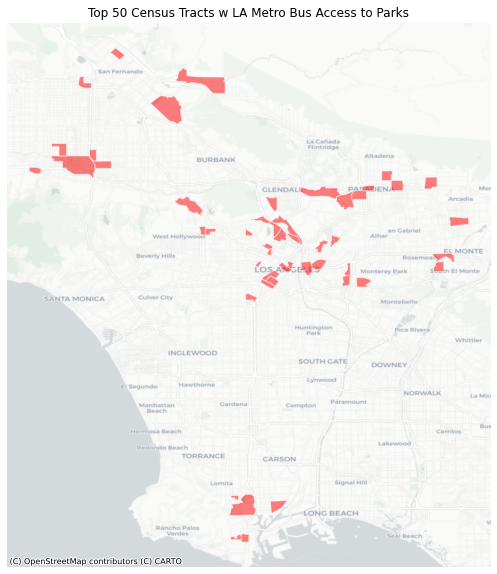

In [26]:
fig,ax = plt.subplots(figsize=(12,10))
tractswbuses.sort_values(by='stops_per_100',ascending=False)[:50].plot(ax=ax,
                                                                 color='red',
                                                                 edgecolor='white',
                                                                 alpha=0.5,legend=True)
ax.set_title('Top 50 Census Tracts w LA Metro Bus Access to Parks')
ax.axis('off')
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=4326)

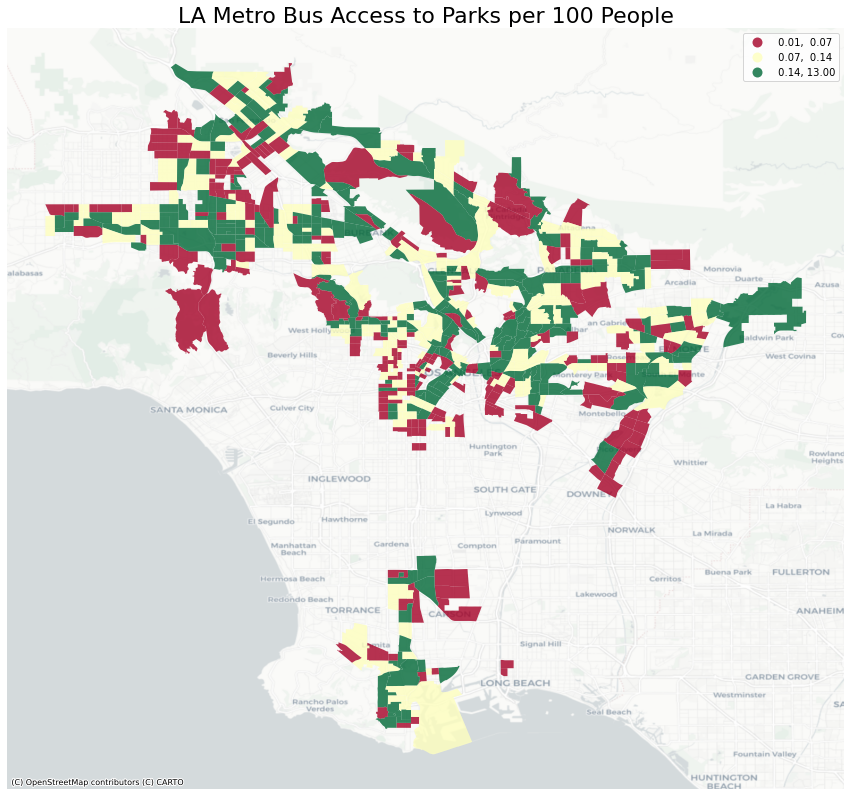

In [27]:
fig,ax = plt.subplots(figsize=(15,15))

tractswbuses.plot(ax=ax,
        column='stops_per_100',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn',
        scheme='quantiles',
        k=3)

ax.axis('off')
ax.set_title('LA Metro Bus Access to Parks per 100 People',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=4326)

Next, I want to calculate spatial lag to better represent the distribution of bus stops to parks. This accounts for the fact that the census tracts aren't firm boundaries - people can cross them and that impacts their proximity to buses that lead to parks.

In [28]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(tractswbuses,k=8)

# Row-standardization
wq.transform = 'r'

/opt/conda/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [29]:
tractswbuses['stops_per_100_lag'] = lps.weights.lag_spatial(wq, tractswbuses['stops_per_100'])

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [30]:
tractswbuses

,FIPS,name,Population,geometry,index_right,STOPNUM,LINE,STOPNAME,bus_stop_count,stops_per_100,stops_per_100_lag
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",424.0,2067.0,90.0,FOOTHILL / WYNGATE,2,0.046696,0.115996
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",861.0,3956.0,90.0,FOOTHILL / FERNGLEN,2,0.031511,0.117894
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",409.0,2047.0,90.0,FOOTHILL / PINEWOOD,4,0.108050,0.108326
8,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",2020.0,10603.0,90.0,FOOTHILL / SALUDA,7,0.180227,0.090725
15,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3458.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221...",2016.0,10597.0,90.0,FOOTHILL / PINEWOOD,6,0.173511,0.100144
...,...,...,...,...,...,...,...,...,...,...,...
3659,14000US06037700101,"Census Tract 7001.01, Los Angeles, CA",5200.0,"MULTIPOLYGON (((-118.36154 34.09446, -118.3603...",2710.0,14401.0,4.0,SANTA MONICA / LA BREA,7,0.134615,0.173846
3666,14000US06037700102,"Census Tract 7001.02, Los Angeles, CA",4506.0,"MULTIPOLYGON (((-118.36142 34.08722, -118.3613...",1126.0,6015.0,4.0,SANTA MONICA / FULLER,6,0.133156,0.161794
3672,14000US06037980015,"Census Tract 9800.15, Los Angeles, CA",671.0,"MULTIPOLYGON (((-118.31048 33.76685, -118.3102...",3351.0,17591.0,205.0,WESTERN / AVENIDA APRENDA,4,0.596125,0.139478
3676,14000US06037980024,"Census Tract 9800.24, Los Angeles, CA",223.0,"MULTIPOLYGON (((-118.51849 34.18389, -118.5184...",112.0,515.0,154.0,BURBANK / HAYVENHURST,29,13.004484,0.147835


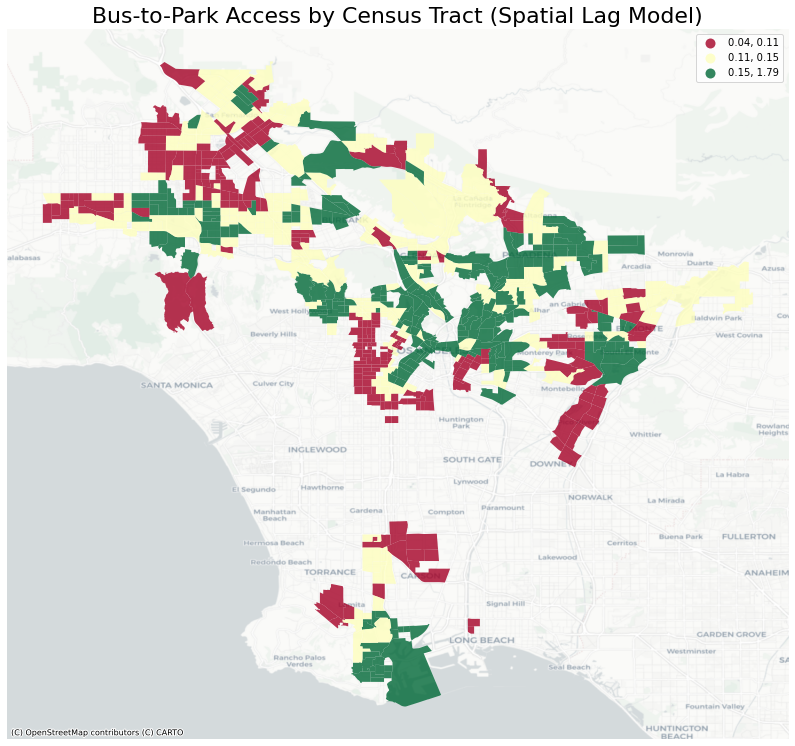

In [31]:
fig,ax = plt.subplots(figsize=(14,14))

tractswbuses.plot(ax=ax,
        column='stops_per_100_lag',
        legend=True,
        alpha=0.8,
        linestyle='-',
        linewidth=1,
        cmap='RdYlGn',
        scheme='quantiles',
        k=3)

ax.axis('off')
ax.set_title('Bus-to-Park Access by Census Tract (Spatial Lag Model)',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs=4326)

In [32]:
parks = pd.read_csv('ParkList.csv')
parks = parks[['Park','Latitude','Longitude']]
parks

,Park,Latitude,Longitude
0,Castaic Lake State Recreation Area,34.5347,-118.6108
1,Central Park,34.4341,-118.5226
2,El Dorado Regional Park East,33.8097,-118.0868
3,El Dorado Regional Park West,33.8072,-118.0946
4,Elysian Park,34.0820,-118.2496
5,Ernest E. Debs Regional Park,34.0912,-118.1932
6,Frank Bonelli Regional Park,34.0772,-117.8101
7,Griffith Park 1,34.1170,-118.2979
8,Griffith Park 2,34.1093,-118.3076
9,Hahamonga Watershed Park,34.1943,-118.1777


In [33]:
parks['Latitude'] = parks['Latitude'].astype(float)
parks['Longitude'] = parks['Longitude'].astype(float)

In [35]:
import folium

In [36]:
m2 = folium.Map(location=[34.0522,-118.2437],
    zoom_start=10,
    tiles='OpenStreetMap',
    attribution='CartoDB')

for index, row in parks.iterrows():
    folium.Marker(
        [row.Latitude,row.Longitude], 
        tooltip=row.Park,
        icon=folium.Icon(icon='star',color='green')
    ).add_to(m2)
m2

In [37]:
m2.save('parks.html')

In [46]:
censustracts3 = gpd.read_file('acs2019_5yr_B01003_14000US06037432102.geojson')

In [53]:
censustracts3

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US06037,"Los Angeles County, CA",10081570.0,0.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,443.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,334.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,484.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,276.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
...,...,...,...,...,...
2342,14000US06037980031,"Census Tract 9800.31, Los Angeles, CA",1175.0,178.0,"MULTIPOLYGON (((-118.29105 33.75378, -118.2905..."
2343,14000US06037980033,"Census Tract 9800.33, Los Angeles, CA",16.0,23.0,"MULTIPOLYGON (((-118.24897 33.75590, -118.2470..."
2344,14000US06037990100,"Census Tract 9901, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.95114 33.99643, -118.9505..."
2345,14000US06037990200,"Census Tract 9902, Los Angeles, CA",0.0,12.0,"MULTIPOLYGON (((-118.63598 34.03255, -118.6325..."


In [56]:
county = censustracts3.loc[censustracts3['geoid']== '05000US06037']
county

,geoid,name,B01003001,"B01003001, Error",geometry
0,05000US06037,"Los Angeles County, CA",10081570.0,0.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033..."


In [60]:
bins = list(tractswbuses["stops_per_100_lag"].quantile([0, 0.33, 0.66, 0.99, 1]))

m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='CartoDBpositron')

folium.GeoJson(county, 
               name="county",
               style_function = lambda x: {
                   'color': 'black',
                   'weight': 0.8,
                   "opacity":0.7,
                   'fillOpacity': 0,
                   'interactive':False
    }).add_to(m)

folium.GeoJson(censustracts, 
               name="censustracts",
               style_function = lambda x: {
                   'color': 'black',
                   'weight': 0.2,
                   "opacity":0.4,
                   'fillOpacity': 0,
                   'interactive':False
    }).add_to(m)

choropleth = folium.Choropleth(
                  geo_data=tractswbuses, 
                  data=tractswbuses,         
                  key_on='feature.properties.FIPS',
                  columns=['FIPS', 'stops_per_100_lag'],
                  fill_color='RdYlGn',
                  line_weight=0.5, 
                  line_color='gray',
                  fill_opacity=0.8,
                  line_opacity=0.5,
                  bins=bins,
                  zoom_on_click=True,
                  legend_name='Bus-to-Park Access by Census Tract (Spatial Lag Model)').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name','Population','bus_stop_count','stops_per_100_lag'],labels=True)
)

for index, row in parks.iterrows():
    folium.Marker(
        [row.Latitude,row.Longitude], 
        tooltip=row.Park,
        icon=folium.Icon(icon='star',color='darkblue')
    ).add_to(m)

m

In [61]:
m.save('bustoparkmap.html')